# Week 9 Assignment (Group Assignment #4)

### Group Name: Motro City Motor Equity
### Group Member: Akshay Jalluri

Since the code for the final project crashes when I run it all at once, I saved a geojson file in the middle which shows the underserved and overserved transit areas, and I will be uploading that geojson file onto here and the continuing it. The rest of the code leading up to this is in Group_Project/UPDATED- GroupAssignment2.ipynb. This way, the code will run much faster. The excel file is called service.geojson and it is attached within this folder up221-akshay/Week 9/service.geojson.

Plotting the graph that concluded the code for the midterm project, to which we will be conducting spatial analysis on.

In [1]:
# Importing all the libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Polygon

import contextily as ctx
import plotly.express as px

In [127]:
# Making the service geojson file into a geodatframe
service = gpd.read_file("service.geojson")

Text(0.5, 1.0, 'Analysis of Transit Overserved and Transit Underserved Areas')

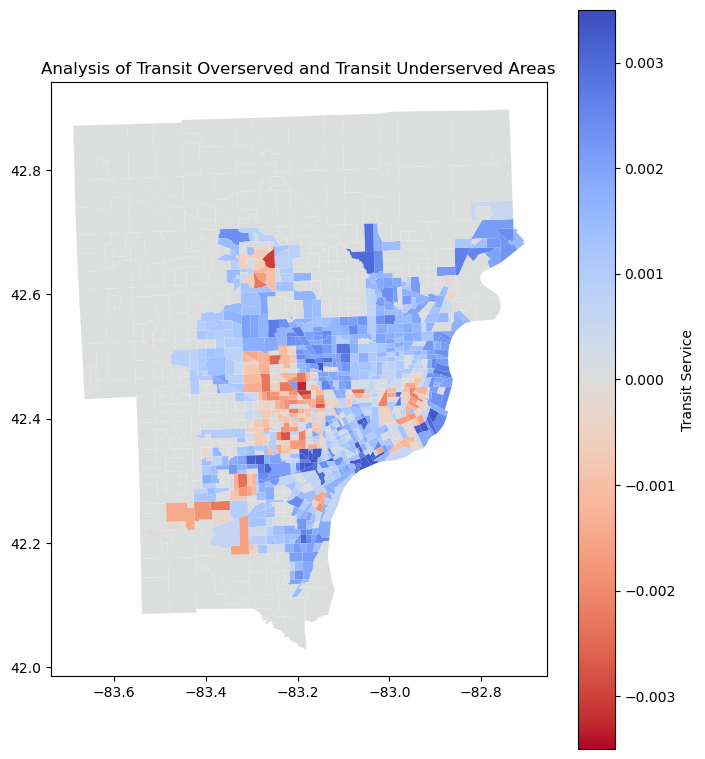

In [3]:
# This is plotting the service plot from the previous project
service.plot(figsize=(8, 9.6), 
             column='Residual', 
             legend=True, cmap='coolwarm_r', 
             legend_kwds={"label": "Transit Service"},
             vmin=-0.0035, vmax=0.0035)
plt.title('Analysis of Transit Overserved and Transit Underserved Areas')

Overall, this is a very informative map that shows the analysis of overserved and underserved transit areas. However, from last time the only variable that was considered was racial disparity, and we were trying to determines areas that transit is overserved and underserved only based on this racial equity. Races who tend to use transit more should be better served by transit than those who don't. However in reality, race isn't the only thing that determines how much transit should be in place. In areas where there is a lot more jobs, there should be more transit options even though the demographics of those actually living there might not indicate it. For example, in our previous analysis, downtown Detroit was shown as a heavily transit overserved place because not many minorities live there. However, with how many job opportunities are in downtown Detroit, the number of transit options is actually justified. That is why it is important to take job/employment opporunities within a census tract into account, which is what we will do in the enxt section of our analysis. 

## Incorporating Job Hotspots using Distance-Based Kernel Weights (Spatial Statistics)

We have the data for population in each census tract, we also have data on number of jobs in each census tract. We could use this data to create a gravity model to see which work flows are the highest. We can use the results to update whether a particular area is underserved or overserved because right now it is only based on race, not employment opportunities.

In [67]:
!pip install pysal  --quiet                 # We must force install the pysal library to run spatial weight analysis

In [86]:
# We are using kernel spatial weight analysis. I learned this from https://geographicdata.science/book/notebooks/04_spatial_weights.html
from pysal.lib import cg as geometry
from pysal.lib import weights

The reason why we have to do spatial weights instead of just finiding a open datasource that contains this information is because I was not able to find one online. There was an online Leaflet map from SEMCOG (Southeast Michigan Council of Governments) Employment Density Map, the equivalent of SCAG in Southern California; however, the datasource was not open, and even after emailing them, I was not able to get a hold of them. So instead, I came up with another idea. Jobs typically tend to cluster in several areas around a metro area and radiate out from there, with less job density expanding from that. I used that property, along with what we learned in class about spatial autocorrelation and learning from online to try to replicate a dataset that can take job density in particular areas into account. I identified the job hotspots within the metro-Detroit area within DDOT bus system network and then mapped it out spatially. Below is the code to help me achieve that.

NameError: name 'percentile_bins' is not defined

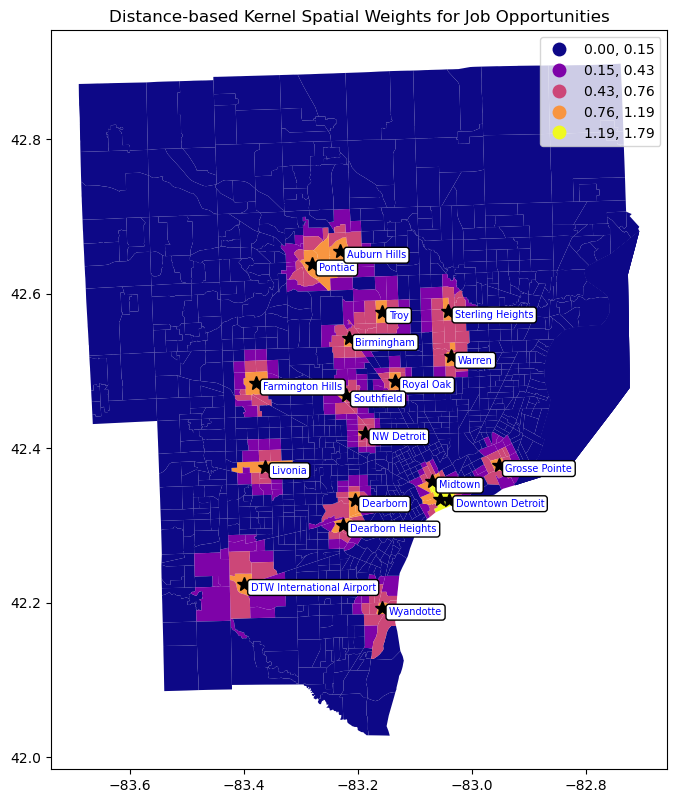

In [82]:
# Building weights with adaptive bandwidth
w_adaptive = weights.distance.Kernel.from_dataframe(service, fixed=False, k=25)

# Creating full matrix version of weights
full_matrix, ids = w_adaptive.full()

# For each of the job hotspots, we indicated the row number of that FIPS location in the service geodataframe and complied it in a list
# Within service geodataframe, row 383 & 424 is downtown Detroit, 682 is Royal Oak, 422 is Midtown, 543 is Dearborn, 409 for Dearborn again, 172 for DTW, 914 for Pontiac, 105 for Auburn Hills, 327 for Troy, 1036 for Warren, 429 for Southfield, 146 for NW Detroit, 468 for Grosse Pointe, 584 for Wyandotte, 57 for Livonia, 501 for Farmington Hills, 902 for Birmingham, 965 for Sterling Heights     
jobloc = [383, 424, 682, 422, 543, 409, 172, 914, 105, 327, 1036, 429, 146, 468, 584, 57, 501, 902, 965]
locname = ['Downtown Detroit', '', 'Royal Oak', 'Midtown', 'Dearborn Heights', 'Dearborn', 'DTW International Airport', 'Pontiac', 'Auburn Hills', 'Troy', 'Warren', 'Southfield', 'NW Detroit', 'Grosse Pointe', 'Wyandotte', 'Livonia', 'Farmington Hills', 'Birmingham', 'Sterling Heights'] 

service['total_weight'] = 0                                  # Creating a new column in the service GeoDataFrame which is where the weights will go into
for i in range(len(jobloc)):
    service['total_weight'] += full_matrix[jobloc[i]]        # Adding the weight values from each of the cities into their respective locations in the service geodataframe

# Setting up figure and axis
fig, ax = plt.subplots(figsize=(8, 9.6))

# Plotting the total_weight column for all tracts
service.plot("total_weight", cmap="plasma", ax=ax, legend=True, label="Combined Kernel Maps", scheme='NaturalBreaks')

# Adding centroid markers of focal tracts and city label markers for all the locations
for i in range(len(jobloc)):
    centroid = service.loc[jobloc[i], 'geometry'].centroid
    ax.plot(centroid.x, centroid.y, marker="*", color="k", markersize=10)
    ax.annotate(locname[i], (centroid.x, centroid.y), xytext=(5, -5), textcoords="offset points", color="blue", fontsize=7, bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black"))

# Setting titles
ax.set_title("Distance-based Kernel Spatial Weights for Job Opportunities")

# Setting the color bar because we are doing Natural Breaks to make the colors pop out more
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=percentile_bins, cmap="plasma"), ax=ax)
cbar.set_label('Total Weight', rotation=270, labelpad=15)

# Adding legend
ax.legend()

# Displaying the plot
plt.show()

As you can see, here is the map of the job hotspots within metor-Detroit. The spatial weights of each of these census tracts will adjust the Residual value from the previous graph in order to make a more accurate map of which areas are overserved and underserved by transit. The code cell below is what I used to see which row indices a particular census tract is in. It helped me a lot with determining which residual values I will eventually need to update.

In [ ]:
# Assuming `gdf` is your GeoDataFrame and `desired_fips` is the FIPS number you want to find
desired_fips = '26099982001'

# Check if the FIPS number exists in the GeoDataFrame
if desired_fips in service["FIPS"].values:
    row_index = service.index[service["FIPS"] == desired_fips].tolist()[0]              # Get the index where the FIPS number is located
    print(f"The FIPS number {desired_fips} is in row index: {row_index}")
else:
    print(f"The FIPS number {desired_fips} does not exist in the GeoDataFrame.")

Below is the formula I used to calculate the new residuals from the old one. 500 was obtained from trial-and-error to create the most accurate map to reality.

In [83]:
# We are subtracting them because the more total weight a location had, the more jobs it had so the transit serving that place is not very overserved
service['Residual_new'] = service['Residual'] - (service['total_weight'] / 500)

Text(0.5, 1.0, 'Analysis of Transit Overserved and Transit Underserved Areas')

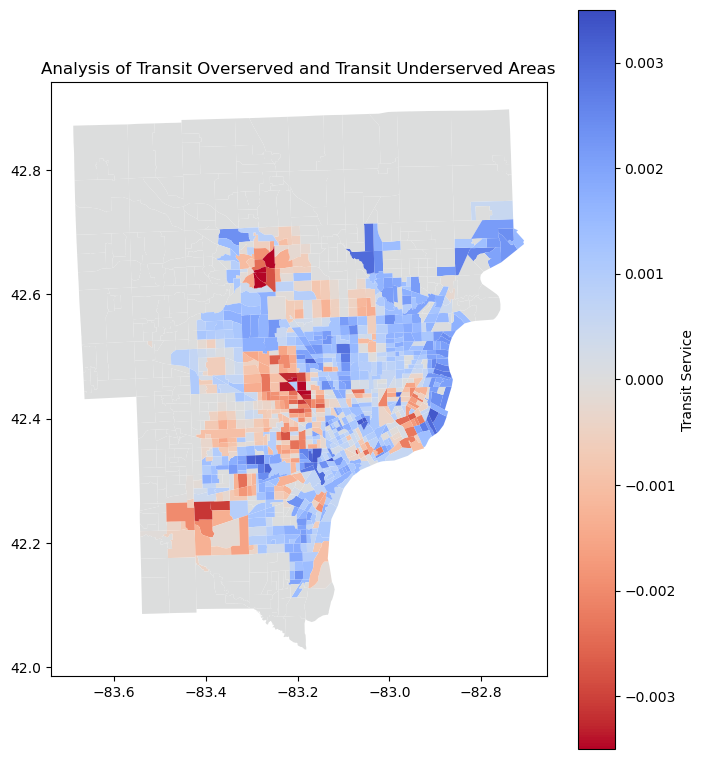

In [84]:
# Plotting the new transit overserved/underserved analysis graph by taking both race & employment locations into account
service.plot(figsize=(8, 9.6),
             column='Residual_new', 
             legend=True, cmap='coolwarm_r', 
             legend_kwds={"label": "Transit Service"},
             vmin=-0.0035, vmax=0.0035)
plt.title('Analysis of Transit Overserved and Transit Underserved Areas')

## Global Spatial Autocorrelation

In [87]:
# Importing the libraries to conduct graphical analysis
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

In [88]:
# Calculating spatial weight
wq =  lps.weights.KNN.from_dataframe(service,k=8)

# Row-standardization
wq.transform = 'r'

Text(0.5, 1.0, 'Analysis of Transit Overserved and Transit Underserved Areas')

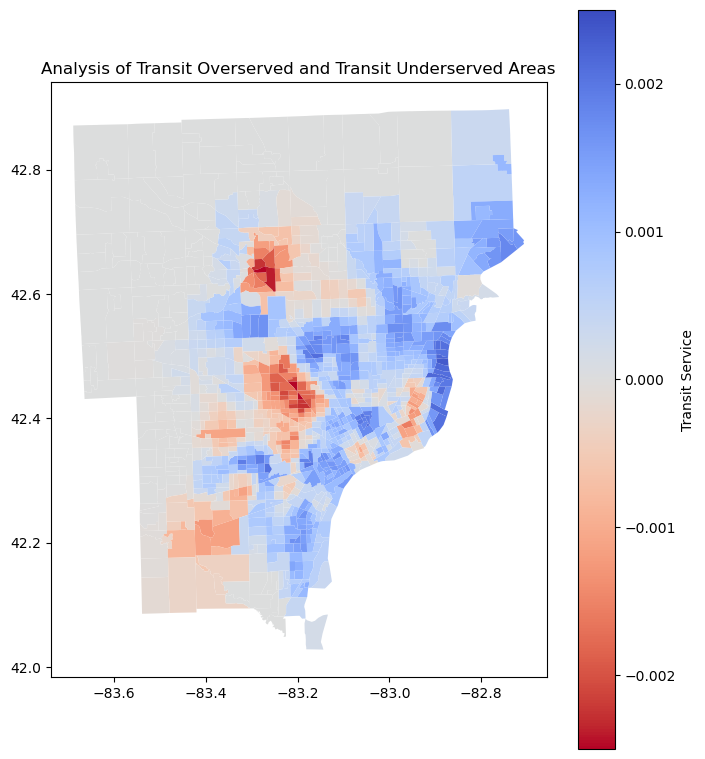

In [94]:
# Spatial Lag

# Creating a new column for spatial lag
service['Residual_new_lag'] = lps.weights.lag_spatial(wq, service['Residual_new'])

# Plotting the new map
service.plot(figsize=(8, 9.6),
             column='Residual_new_lag', 
             legend=True, cmap='coolwarm_r', 
             legend_kwds={"label": "Transit Service"},
             vmin=-0.0025, vmax=0.0025)
plt.title('Analysis of Transit Overserved and Transit Underserved Areas')

(-83.7386116, -82.6567924, 41.98444945, 42.941021549999995)

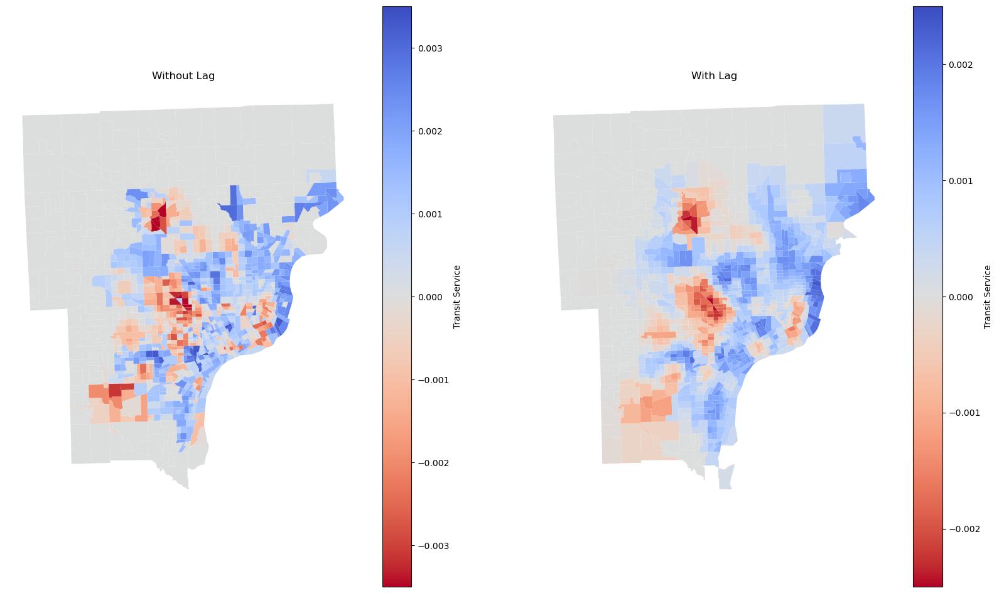

In [98]:
# Creating side-by-side plots of without spatial lag vs with spatial lag
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# Without Lag
service.plot(ax = ax[0],
             column='Residual_new', 
             legend=True, cmap='coolwarm_r', 
             legend_kwds={"label": "Transit Service"},
             vmin=-0.0035, vmax=0.0035)
ax[0].set_title('Without Lag')
ax[0].axis("off")

# With Lag
service.plot(ax = ax[1],
             column='Residual_new_lag', 
             legend=True, cmap='coolwarm_r', 
             legend_kwds={"label": "Transit Service"},
             vmin=-0.0025, vmax=0.0025)
ax[1].set_title('With Lag')
ax[1].axis("off")

From using spatial lag, it makes the map cleaner and gives more correlation between census tracts than withour spatial lag. Trends are better identified and this is much closer to reality as two places that are closer to eachother are more related to eachother than places that are further away from eachother. Spatial lag takes that into account, thus making it a much better map for analysis.

/tmp/ipykernel_1364/2256162619.py:9: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_1364/2256162619.py:10: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




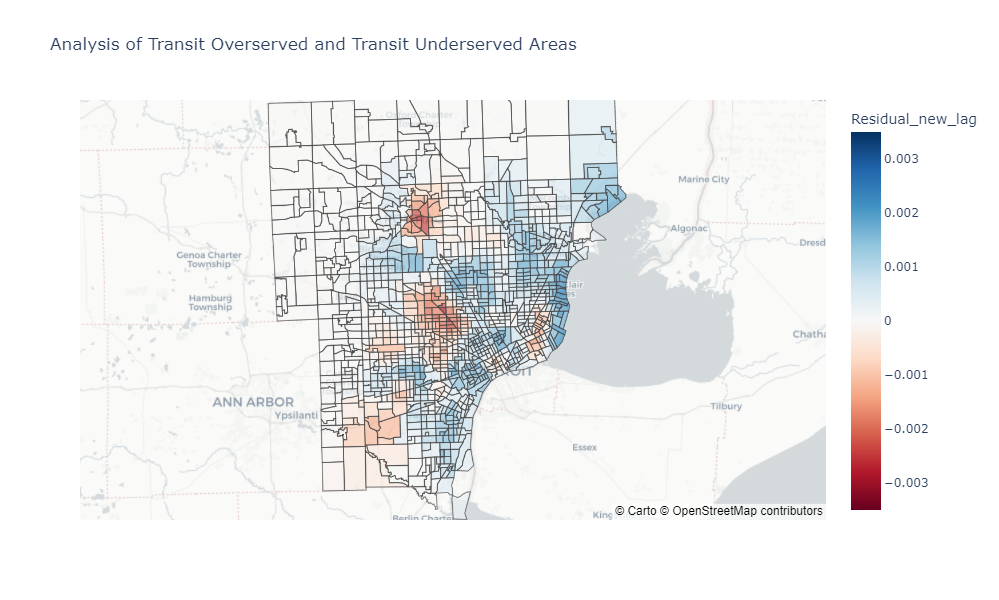

In [100]:
# Create the Plotly Express map
fig = px.choropleth_mapbox(service, 
                           geojson=service.geometry, 
                           locations=service.index, 
                           color='Residual_new_lag',
                           color_continuous_scale='RdBu',
                           range_color=(-0.0035, 0.0035),
                           mapbox_style="carto-positron",
                           center={"lat": service.centroid.y.mean(), 
                                   "lon": service.centroid.x.mean()},
                           zoom=8,
                           labels={'Residual_new': 'Transit Service'},
                           title='Analysis of Transit Overserved and Transit Underserved Areas',
                           width=800,  # Set the width to 800 pixels
                           height=600,  # Set the height to 600 pixels
                           hover_data={'FIPS': True, 'Residual_new': True},  # Include FIPS and Residual_new in hover
                           opacity = 0.7
                          )

# Show the plot
fig.show()

## Moran's Plot

It is a way to quantify spatial correlations. This is used by the measure of global autocorrection, a positive value will indicate that higher values tend to be closer to higher values like clusters and a negative value will indicate that higher values tend to be closer to lower values and vice versa (like a chess board).

In [105]:
# Before we do Moran's Plot, we first need to drop all the missing values. We can just put placement median values in place.
missing_values = service['Residual_new'].isnull().sum()
service['Residual_new'].fillna(service['Residual_new'].median(), inplace=True)

# Now we can get the Moran's I value
y = service.Residual_new
moran = Moran(y, wq)
moran.I

0.513908086121637

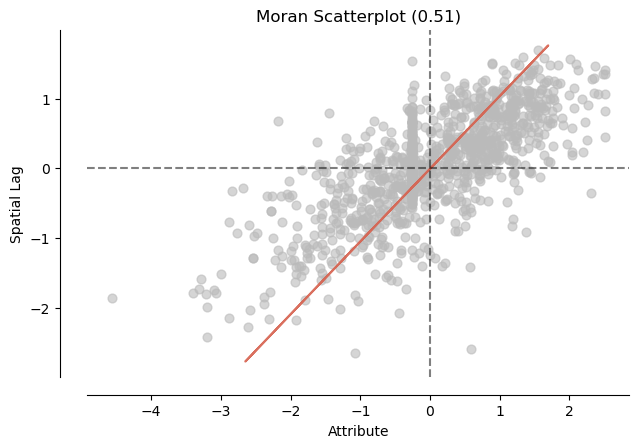

In [106]:
# Plotting a scatterplot
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

Now we have to calculate the significance of the Moran's I value

/opt/conda/lib/python3.11/site-packages/splot/_viz_esda_mpl.py:354: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




(<Figure size 700x700 with 1 Axes>,
 <Axes: title={'center': 'Reference Distribution'}, xlabel='Moran I: 0.51', ylabel='Density'>)

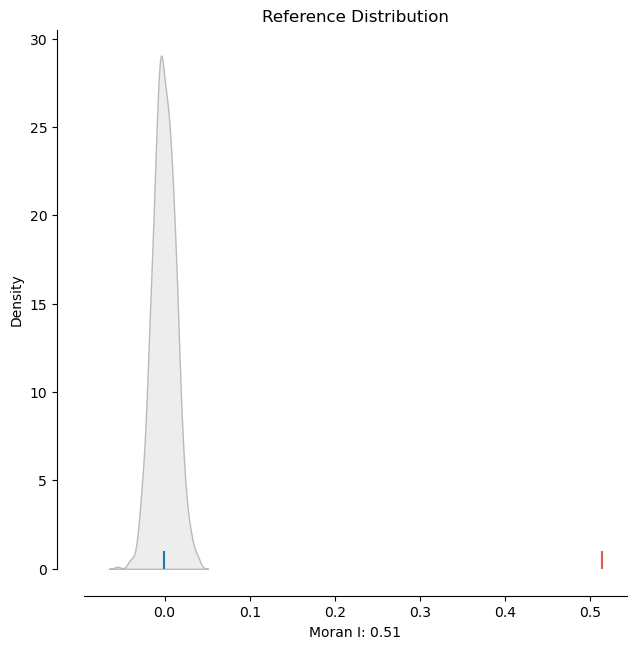

In [107]:
plot_moran_simulation(moran,aspect_equal=False)

In [108]:
# Computing the 0-value
moran.p_sim

0.001

This is a very low value, so the probability of this being just random is so low that it becomes statistically significant. This makes the fact that there indeed are areas in metro-Detroit that are overserved and those that are underserved more evident.

## Moran's Local Scatterplot

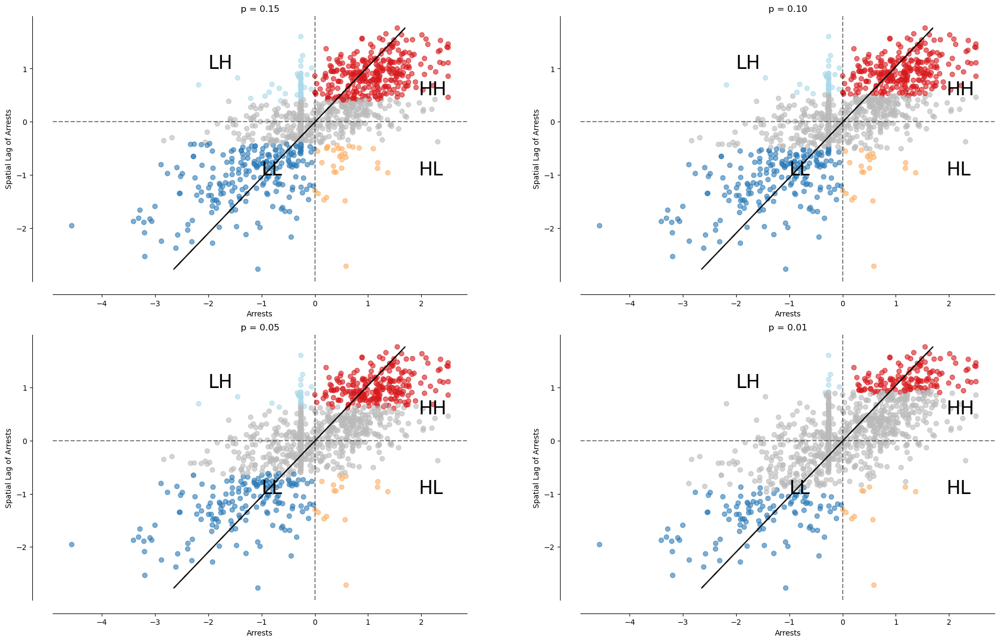

In [126]:
# Calculating local moran values
lisa = esda.moran.Moran_Local(y, wq)


# Creating 2x2 subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 12))



# Plotting it for p = 0.15
moran_scatterplot(lisa, ax=ax1, p=0.15)
ax1.set_xlabel("Arrests")
ax1.set_ylabel('Spatial Lag of Arrests')
ax1.set_title('p = 0.15')
# add some labels
ax1.text(1.95, 0.5, "HH", fontsize=25)
ax1.text(1.95, -1, "HL", fontsize=25)
ax1.text(-2, 1, "LH", fontsize=25)
ax1.text(-1, -1, "LL", fontsize=25)



# Plotting it for p = 0.10
moran_scatterplot(lisa, ax=ax2, p=0.10)
ax2.set_xlabel("Arrests")
ax2.set_ylabel('Spatial Lag of Arrests')
ax2.set_title('p = 0.10')
# add some labels
ax2.text(1.95, 0.5, "HH", fontsize=25)
ax2.text(1.95, -1, "HL", fontsize=25)
ax2.text(-2, 1, "LH", fontsize=25)
ax2.text(-1, -1, "LL", fontsize=25)



# Plotting it for p = 0.05
moran_scatterplot(lisa, ax=ax3, p=0.05)
ax3.set_xlabel("Arrests")
ax3.set_ylabel('Spatial Lag of Arrests')
ax3.set_title('p = 0.05')
# add some labels
ax3.text(1.95, 0.5, "HH", fontsize=25)
ax3.text(1.95, -1, "HL", fontsize=25)
ax3.text(-2, 1, "LH", fontsize=25)
ax3.text(-1, -1, "LL", fontsize=25)



# Plotting it for p = 0.01
moran_scatterplot(lisa, ax=ax4, p=0.01)
ax4.set_xlabel("Arrests")
ax4.set_ylabel('Spatial Lag of Arrests')
ax4.set_title('p = 0.01')
# add some labels
ax4.text(1.95, 0.5, "HH", fontsize=25)
ax4.text(1.95, -1, "HL", fontsize=25)
ax4.text(-2, 1, "LH", fontsize=25)
ax4.text(-1, -1, "LL", fontsize=25)


plt.tight_layout()
plt.show()

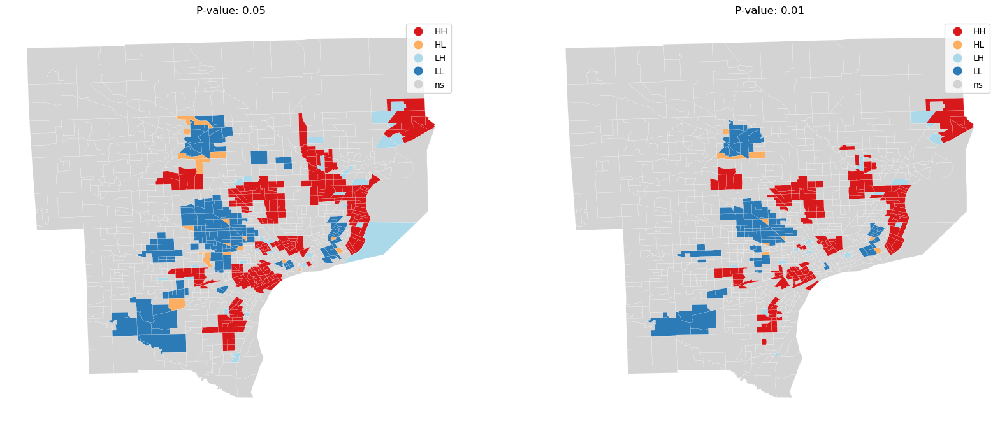

In [125]:
# Spatial Autocorrelation Map

# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# regular count map on the left
lisa_cluster(lisa, service, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa, service, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

plt.show()